<!-- WARNING: THIS FILE WAS AUTOGENERATED! DO NOT EDIT! -->

**NOTE : this is mostly a copy from BERTopic best practices notebook where i've placed notes that resonate with my understanding of topic modelling**

book
Through the nature of BERTopic, its modularity, many variations of the topic modeling technique is possible. However, during the development and through the usage of the package, a set of best practices have been developed that generally lead to great results.

The following are a number of steps, parameters, and settings that you can use that will generally improve the quality of the resulting topics. In other words, after going through the quick start and getting a feeling for the API these steps should get you to the next level of performance.

**NOTE:**
    Although these are called *best practices*, it does not necessarily mean that they work across all use cases perfectly. The underlying modular nature of BERTopic is meant to take different use cases into account. After going through these practices it is advised to fine-tune wherever necessary.

<br>

<img src="https://raw.githubusercontent.com/MaartenGr/BERTopic/master/images/logo.png" width="20%">

## Data
For this example, we will use a dataset containing abstracts and metadata from [ArXiv articles](https://huggingface.co/datasets/arxiv_dataset).

In [1]:
from datasets import load_dataset
import numpy as np

dataset = load_dataset("CShorten/ML-ArXiv-Papers")["train"]

# Extract abstracts to train on and corresponding titles
abstracts = np.array(dataset["abstract"])
titles = np.array(dataset["title"])

idxs = np.random.randint(0,len(titles), 20_000)

In [2]:
# reducing as to allow quick embeddings creation for testing
abstracts = abstracts[idxs]
titles = titles[idxs]

In [3]:
abstracts[0]

'  Imagine a robot is shown new concepts visually together with spoken tags,\ne.g. "milk", "eggs", "butter". After seeing one paired audio-visual example per\nclass, it is shown a new set of unseen instances of these objects, and asked to\npick the "milk". Without receiving any hard labels, could it learn to match the\nnew continuous speech input to the correct visual instance? Although unimodal\none-shot learning has been studied, where one labelled example in a single\nmodality is given per class, this example motivates multimodal one-shot\nlearning. Our main contribution is to formally define this task, and to propose\nseveral baseline and advanced models. We use a dataset of paired spoken and\nvisual digits to specifically investigate recent advances in Siamese\nconvolutional neural networks. Our best Siamese model achieves twice the\naccuracy of a nearest neighbour model using pixel-distance over images and\ndynamic time warping over speech in 11-way cross-modal matching.\n'

**🔥 Tip - Sentence Splitter 🔥**
***
 Whenever you have large documents, you typically want to split them up into either paragraphs or sentences. A nice way to do so is by using NLTK's sentence splitter which is nothing more than:

```python
from nltk.tokenize import sent_tokenize, word_tokenize
sentences = [sent_tokenize(abstract) for abstract in abstracts]
sentences = [sentence for doc in sentences for sentence in doc]
```
Also note this will make your topic analysis lose doc level context. Choose the approach based on your specific needs and the nature of your documents. For most applications, paragraph splitting provides a good balance between detail and context.
***

# **Best Practices**

With feedback from the community throughout the development of BERTopic and the core maintainer's personal experience, there are a number of best practices developed that generally lead to an improved topic model.

The goal of these best practices to quickly guide the user to what is commonly used to speed-up training, improve performance, explore alternatives, etc. Instead of having to search through many issues and discussions, an overview of best practices are discussed here.

To start off, it is important to have a general idea of the pipeline of BERTopic as it relates to many of these best practices.

BERTopic can be viewed as a sequence of steps to create its topic representations. There are five steps to this process:

![https://maartengr.github.io/BERTopic/algorithm/default.svg](https://maartengr.github.io/BERTopic/algorithm/default.svg)

The pipeline above implies significant modularity of BERTopic. Each step in this process was carefully selected such that they are all somewhat independent from one another.

As a result, we can adopt the pipeline to the current state-of-the-art with respect to each individual step:

 ![https://maartengr.github.io/BERTopic/algorithm/modularity.svg](https://maartengr.github.io/BERTopic/algorithm/modularity.svg)

## **Pre-calculate Embeddings**
After having created our data, namely `abstracts`, we can dive into the very first best practice, **pre-calculating embeddings**.

BERTopic works by converting documents into numerical values, called embeddings. This process can be very costly, especially if we want to iterate over parameters. Instead, we can calculate those embeddings once and feed them to BERTopic to skip calculating embeddings each time.

In [4]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

Batches:   0%|          | 0/625 [00:00<?, ?it/s]

In [5]:
embeddings.shape # 384 weights per document

(20000, 384)

In [6]:
embeddings[0].shape

(384,)

## **Preventing Stochastic Behavior**
In BERTopic, we generally use a dimensionality reduction algorithm to reduce the size of the embeddings. This is done to prevent the [curse of dimensionality](https://en.wikipedia.org/wiki/Curse_of_dimensionality) to a certain degree.

As a default, this is done with [UMAP](https://github.com/lmcinnes/umap) which is an incredible algorithm for reducing dimensional space. However, by default, it shows stochastic behavior which creates different results each time you run it. To prevent that, we will need to set a `random_state` of the model before passing it to BERTopic.

As a result, we can now fully reproduce the results each time we run the model.

In [7]:
from umap import UMAP

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

## **Controlling Number of Topics**
There is a parameter to control the number of topics, namely `nr_topics`. This parameter, however, merges topics **after** they have been created. It is a parameter that supports creating a fixed number of topics.

However, it is advised to control the number of topics through the cluster model which is by default HDBSCAN. HDBSCAN has a parameter, namely `min_topic_size` that indirectly controls the number of topics that will be created.

A higher `min_topic_size` will generate fewer topics and a lower `min_topic_size` will generate more topics.

Here, we will go with `min_topic_size=40` to get around XXX topics.

In [8]:
from hdbscan import HDBSCAN

hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

## **Improving Default Representation**
The default representation of topics is calculated through [c-TF-IDF](https://maartengr.github.io/BERTopic/algorithm/algorithm.html#5-topic-representation). However, c-TF-IDF is powered by the [CountVectorizer](https://maartengr.github.io/BERTopic/getting_started/vectorizers/vectorizers.html) which converts text into tokens. Using the CountVectorizer, we can do a number of things:

* Remove stopwords
* Ignore infrequent words
* Increase

In other words, we can preprocess the topic representations **after** documents are assigned to topics. This will not influence the clustering process in any way.

Here, we will ignore English stopwords and infrequent words. Moreover, by increasing the n-gram range we will consider topic representations that are made up of one or two words.

In [9]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer(stop_words="english", 
                                   min_df=.05,
                                   max_df=.8,
                                   ngram_range=(1, 2))

## **Additional Representations**
Previously, we have tuned the default representation but there are quite a number of [other topic representations](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html) in BERTopic that we can choose from. From [KeyBERTInspired](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#keybertinspired) and [PartOfSpeech](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html#partofspeech), to [OpenAI's ChatGPT](https://maartengr.github.io/BERTopic/getting_started/representation/llm.html#chatgpt) and [open-source](https://maartengr.github.io/BERTopic/getting_started/representation/llm.html#langchain) alternatives, many representations are possible.

In BERTopic, you can model many different topic representations simultanously to test them out and get different perspectives of topic descriptions. This is called [multi-aspect](https://maartengr.github.io/BERTopic/getting_started/multiaspect/multiaspect.html) topic modeling.

Here, we will demonstrate a number of interesting and useful representations in BERTopic:

* KeyBERTInspired
  * A method that derives inspiration from how KeyBERT works
* PartOfSpeech
  * Using SpaCy's POS tagging to extract words
* MaximalMarginalRelevance
  * Diversify the topic words
* OpenAI
  * Use ChatGPT to label our topics

In [10]:
# import openai
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, OpenAI, PartOfSpeech

# KeyBERT
keybert_model = KeyBERTInspired()

# Part-of-Speech
pos_model = PartOfSpeech("en_core_web_sm")

# MMR
mmr_model = MaximalMarginalRelevance(diversity=0.3)

# GPT-3.5
prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]
The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short but highly descriptive topic label of at most 5 words. Make sure it is in the following format:
topic: <topic label>
"""
# client = openai.OpenAI(api_key="sk-...")
# openai_model = OpenAI(client, model="gpt-3.5-turbo", exponential_backoff=True, chat=True, prompt=prompt)

# All representation models
representation_model = {
    "KeyBERT": keybert_model,
    # "OpenAI": openai_model,  # Uncomment if you will use OpenAI
    "MMR": mmr_model,
    "POS": pos_model
}

## **Training**
Now that we have a set of best practices, we can use them in our training loop. Here, several different representations, keywords and labels for our topics will be created. If you want to iterate over the topic model it is advised to use the pre-calculated embeddings as that significantly speeds up training.

In [11]:
from bertopic import BERTopic

representation_model = {
    "KeyBERT": keybert_model,
    # "OpenAI": openai_model,  # Uncomment if you will use OpenAI
    "MMR": mmr_model,
    "POS": pos_model
}

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,
  # Hyperparameters
  top_n_words=10,
  verbose=True
)

topics, probs = topic_model.fit_transform(abstracts, embeddings)

2024-05-31 17:07:59,544 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-05-31 17:09:13,939 - BERTopic - Dimensionality - Completed ✓
2024-05-31 17:09:13,943 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

In [12]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,MMR,POS,Representative_Docs
0,-1,6216,-1_quantum_tensor_eeg_communication,"[quantum, tensor, eeg, communication, forecast...","[quantum, bayesian optimization, continual lea...","[quantum, tensor, eeg, communication, forecast...","[quantum, tensor, communication, forecasting, ...",[ The quantum approximate optimization algori...
1,0,2771,0_convex_sgd_pruning_epsilon,"[convex, sgd, pruning, epsilon, norm, quantiza...","[convex optimization, descent sgd, generalizat...","[convex, sgd, pruning, epsilon, norm, quantiza...","[convex, pruning, epsilon, norm, quantization,...",[ This work characterizes the benefits of ave...
2,1,2478,1_rl_regret_reward_policies,"[rl, regret, reward, policies, robot, bandit, ...","[deep reinforcement, policy optimization, base...","[rl, regret, reward, policies, robot, bandit, ...","[regret, reward, policies, robot, games, game,...",[ We propose a generic reward shaping approac...
3,2,1335,2_bert_sentence_nlp_entity,"[bert, sentence, nlp, entity, sentiment, langu...","[nlp tasks, entity recognition, processing nlp...","[bert, sentence, nlp, entity, sentiment, langu...","[sentence, entity, sentiment, documents, news,...",[ Retrieval based open-domain QA systems use ...
4,3,887,3_attacks_anomaly_adversarial examples_anomaly...,"[attacks, anomaly, adversarial examples, anoma...","[adversarial attack, adversarial attacks, vuln...","[attacks, anomaly, adversarial examples, anoma...","[attacks, anomaly, adversarial examples, pertu...",[ Adversarial attacks for image classificatio...
5,4,740,4_privacy_federated_fl_federated learning,"[privacy, federated, fl, federated learning, c...","[federated learning, differential privacy, pri...","[privacy, federated, fl, federated learning, c...","[privacy, federated, federated learning, clien...",[ Federated learning was proposed with an int...
6,5,646,5_gnns_graph neural_gnn_node classification,"[gnns, graph neural, gnn, node classification,...","[graph neural, graph learning, learning graphs...","[gnns, graph neural, gnn, node classification,...","[edges, vertices, links, walk, vertex, adjacen...",[Node classification is a fundamental graph-ba...
7,6,593,6_covid_covid 19_ct_3d,"[covid, covid 19, ct, 3d, diagnosis, clinical,...","[medical images, ct scans, chest ray, ct image...","[covid, covid 19, ct, 3d, diagnosis, clinical,...","[diagnosis, clinical, chest, cancer, tumor, di...",[ The novel coronavirus disease 2019 (COVID-1...
8,7,552,7_audio_speaker_music_asr,"[audio, speaker, music, asr, acoustic, speech ...","[speaker recognition, speech data, audio, audi...","[audio, speaker, music, asr, acoustic, speech ...","[audio, speaker, music, acoustic, voice, separ...",[ There has been a recent surge in adversaria...
9,8,413,8_physics_differential equations_equation_fluid,"[physics, differential equations, equation, fl...","[pdes, equations pdes, pde, artificial neural,...","[physics, differential equations, equation, fl...","[physics, differential equations, equation, fl...",[ Solving analytically intractable partial di...


To get all representations for a single topic, we simply run the following:

In [13]:
topic_model.get_topic(1, full=True)

{'Main': [('rl', 0.030642540433382),
  ('regret', 0.02357864800931489),
  ('reward', 0.023368927842700615),
  ('policies', 0.019963649991884134),
  ('robot', 0.01547857624288692),
  ('bandit', 0.014575472830129322),
  ('games', 0.012743609286372788),
  ('game', 0.012504872215040458),
  ('learning rl', 0.011229692897350329),
  ('planning', 0.011050877039426714)],
 'KeyBERT': [('deep reinforcement', 0.5913061),
  ('policy optimization', 0.5595864),
  ('based reinforcement', 0.5162622),
  ('learning rl', 0.5013465),
  ('policy gradient', 0.49714565),
  ('imitation learning', 0.4931822),
  ('optimal policy', 0.4656373),
  ('reward function', 0.4315916),
  ('reward', 0.42668962),
  ('bandit problem', 0.41029584)],
 'MMR': [('rl', 0.030642540433382),
  ('regret', 0.02357864800931489),
  ('reward', 0.023368927842700615),
  ('policies', 0.019963649991884134),
  ('robot', 0.01547857624288692),
  ('bandit', 0.014575472830129322),
  ('games', 0.012743609286372788),
  ('game', 0.012504872215040458

**NOTE**: The labels generated by OpenAI's **ChatGPT** are especially interesting to use throughout your model. Below, we will go into more detail how to set that as a custom label.

**🔥 Tip - Parameters 🔥**
***
If you would like to return the topic-document probability matrix, then it is advised to use `calculate_probabilities=True`. Do note that this can significantly slow down training. To speed it up, use [cuML's HDBSCAN](https://maartengr.github.io/BERTopic/getting_started/clustering/clustering.html#cuml-hdbscan) instead. You could also approximate the topic-document probability matrix with `.approximate_distribution` which will be discussed later.
***

## **(Custom) Labels**
The default label of each topic are the top 3 words in each topic combined with an underscore between them.

This, of course, might not be the best label that you can think of for a certain topic. Instead, we can use `.set_topic_labels` to manually label all or certain topics.

We can also use `.set_topic_labels` to use one of the other topic representations that we had before, like `KeyBERTInspired` or even `OpenAI`.

In [14]:
# Label the topics yourself
topic_model.set_topic_labels({1: "Space Travel", 7: "Religion"})

# or use one of the other topic representations, like KeyBERTInspired
keybert_topic_labels = {topic: " | ".join(list(zip(*values))[0][:3]) for topic, values in topic_model.topic_aspects_["KeyBERT"].items()}
topic_model.set_topic_labels(keybert_topic_labels)

In [15]:
keybert_topic_labels

{-1: 'quantum | bayesian optimization | continual learning',
 0: 'convex optimization | descent sgd | generalization performance',
 1: 'deep reinforcement | policy optimization | based reinforcement',
 2: 'nlp tasks | entity recognition | processing nlp',
 3: 'adversarial attack | adversarial attacks | vulnerable adversarial',
 4: 'federated learning | differential privacy | privacy preserving',
 5: 'graph neural | graph learning | learning graphs',
 6: 'medical images | ct scans | chest ray',
 7: 'speaker recognition | speech data | audio',
 8: 'pdes | equations pdes | pde',
 9: 'gaussian processes | sparse gaussian | deep gaussian',
 10: 'object detectors | 3d objects | 3d object',
 11: 'recommendation performance | collaborative filtering | recommendation systems',
 12: 'traffic forecasting | traffic prediction | traffic data',
 13: 'counterfactual explanations | counterfactual explanation | counterfactuals',
 14: 'gan models | training gans | networks gan',
 15: 'ehr data | health 

Now that we have set the updated topic labels, we can access them with the many functions used throughout BERTopic. Most notably, you can show the updated labels in visualizations with the `custom_labels=True` parameters.

In [16]:
topic_model.get_topic_info()

,Topic,Count,Name,CustomName,Representation,KeyBERT,MMR,POS,Representative_Docs
0,-1,6216,-1_quantum_tensor_eeg_communication,quantum | bayesian optimization | continual le...,"[quantum, tensor, eeg, communication, forecast...","[quantum, bayesian optimization, continual lea...","[quantum, tensor, eeg, communication, forecast...","[quantum, tensor, communication, forecasting, ...",[ The quantum approximate optimization algori...
1,0,2771,0_convex_sgd_pruning_epsilon,convex optimization | descent sgd | generaliza...,"[convex, sgd, pruning, epsilon, norm, quantiza...","[convex optimization, descent sgd, generalizat...","[convex, sgd, pruning, epsilon, norm, quantiza...","[convex, pruning, epsilon, norm, quantization,...",[ This work characterizes the benefits of ave...
2,1,2478,1_rl_regret_reward_policies,deep reinforcement | policy optimization | bas...,"[rl, regret, reward, policies, robot, bandit, ...","[deep reinforcement, policy optimization, base...","[rl, regret, reward, policies, robot, bandit, ...","[regret, reward, policies, robot, games, game,...",[ We propose a generic reward shaping approac...
3,2,1335,2_bert_sentence_nlp_entity,nlp tasks | entity recognition | processing nlp,"[bert, sentence, nlp, entity, sentiment, langu...","[nlp tasks, entity recognition, processing nlp...","[bert, sentence, nlp, entity, sentiment, langu...","[sentence, entity, sentiment, documents, news,...",[ Retrieval based open-domain QA systems use ...
4,3,887,3_attacks_anomaly_adversarial examples_anomaly...,adversarial attack | adversarial attacks | vul...,"[attacks, anomaly, adversarial examples, anoma...","[adversarial attack, adversarial attacks, vuln...","[attacks, anomaly, adversarial examples, anoma...","[attacks, anomaly, adversarial examples, pertu...",[ Adversarial attacks for image classificatio...
5,4,740,4_privacy_federated_fl_federated learning,federated learning | differential privacy | pr...,"[privacy, federated, fl, federated learning, c...","[federated learning, differential privacy, pri...","[privacy, federated, fl, federated learning, c...","[privacy, federated, federated learning, clien...",[ Federated learning was proposed with an int...
6,5,646,5_gnns_graph neural_gnn_node classification,graph neural | graph learning | learning graphs,"[gnns, graph neural, gnn, node classification,...","[graph neural, graph learning, learning graphs...","[gnns, graph neural, gnn, node classification,...","[edges, vertices, links, walk, vertex, adjacen...",[Node classification is a fundamental graph-ba...
7,6,593,6_covid_covid 19_ct_3d,medical images | ct scans | chest ray,"[covid, covid 19, ct, 3d, diagnosis, clinical,...","[medical images, ct scans, chest ray, ct image...","[covid, covid 19, ct, 3d, diagnosis, clinical,...","[diagnosis, clinical, chest, cancer, tumor, di...",[ The novel coronavirus disease 2019 (COVID-1...
8,7,552,7_audio_speaker_music_asr,speaker recognition | speech data | audio,"[audio, speaker, music, asr, acoustic, speech ...","[speaker recognition, speech data, audio, audi...","[audio, speaker, music, asr, acoustic, speech ...","[audio, speaker, music, acoustic, voice, separ...",[ There has been a recent surge in adversaria...
9,8,413,8_physics_differential equations_equation_fluid,pdes | equations pdes | pde,"[physics, differential equations, equation, fl...","[pdes, equations pdes, pde, artificial neural,...","[physics, differential equations, equation, fl...","[physics, differential equations, equation, fl...",[ Solving analytically intractable partial di...


Notice that the overview in `.get_topic_info` now also includes the column `CustomName`. That is the custom label that we just created for each topic.

## **Topic-Document Distribution**
If using `calculate_probabilities=True` is not possible, than you can [approximate the topic-document distributions](https://maartengr.github.io/BERTopic/getting_started/distribution/distribution.html) using `.approximate_distribution`. It is a fast and flexible method for creating different topic-document distributions.

In [17]:
# `topic_distr` contains the distribution of topics in each document
topic_distr, _ = topic_model.approximate_distribution(abstracts, window=8, stride=4)

100%|████████████████████████████████████████████████████████████████████| 20/20 [00:30<00:00,  1.54s/it]


Next, lets take a look at a specific abstract and see how the topic distribution was extracted:

In [18]:
abstract_id = 12
print(abstracts[abstract_id])

  We present a generic framework for spatio-temporal (ST) data modeling,
analysis, and forecasting, with a special focus on data that is sparse in both
space and time. Our multi-scaled framework is a seamless coupling of two major
components: a self-exciting point process that models the macroscale
statistical behaviors of the ST data and a graph structured recurrent neural
network (GSRNN) to discover the microscale patterns of the ST data on the
inferred graph. This novel deep neural network (DNN) incorporates the real time
interactions of the graph nodes to enable more accurate real time forecasting.
The effectiveness of our method is demonstrated on both crime and traffic
forecasting.



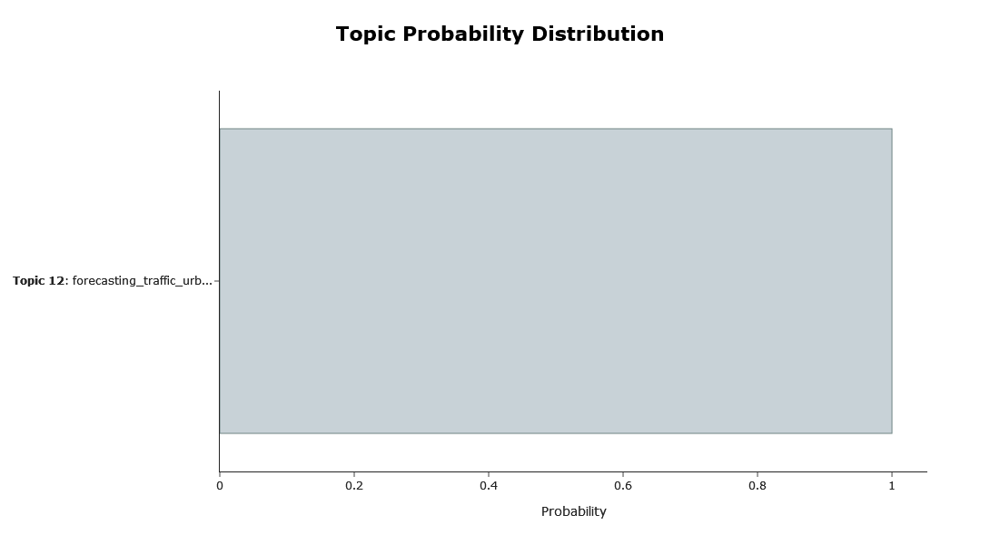

In [19]:
# Visualize the topic-document distribution for a single document
topic_model.visualize_distribution(topic_distr[abstract_id])

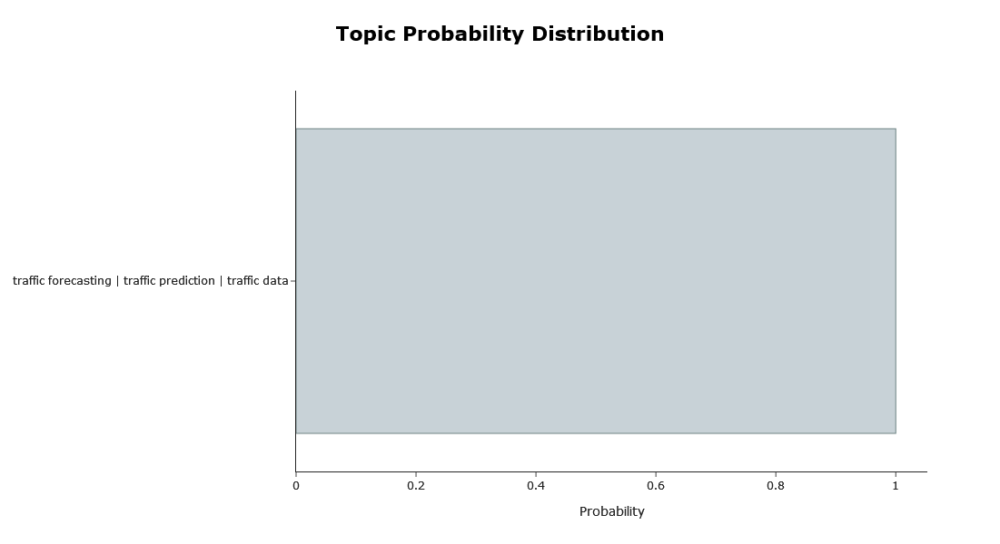

In [20]:
# Visualize the topic-document distribution for a single document
topic_model.visualize_distribution(topic_distr[abstract_id], custom_labels=True)

It seems to have extracted a number of topics that are relevant and shows the distributions of these topics across the abstract. We can go one step further and visualize them on a token-level:

In [21]:
# Calculate the topic distributions on a token-level
topic_distr, topic_token_distr = topic_model.approximate_distribution(abstracts[abstract_id], calculate_tokens=True)

# Visualize the token-level distributions
df = topic_model.visualize_approximate_distribution(abstracts[abstract_id], topic_token_distr[0])
df

100%|██████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 31.97it/s]


,We,present,generic,framework,for,spatio,temporal,ST,data,modeling,analysis,and,forecasting,with,special,focus,on,data,that,is,sparse,in,both,space,and,time,Our,multi,scaled,framework,is,seamless,coupling,of,two,major,components,self,exciting,point,process,that,models,the,macroscale,statistical,behaviors,of,the,ST,data,and,graph,structured,recurrent,neural,network,GSRNN,to,discover,the,microscale,patterns,of,the,ST,data,on,the,inferred,graph,This,novel,deep,neural,network,DNN,incorporates,the,real,time,interactions,of,the,graph,nodes,to,enable,more,accurate,real,time,forecasting,The,effectiveness,of,our,method,is,demonstrated,on,both,crime,and,traffic,forecasting
12_forecasting_traffic_urban_forecast,0.000,0.000,0.000,0.100,0.100,0.100,0.100,0.000,0.000,0.189,0.604,1.019,1.205,1.016,0.601,0.187,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.141,0.318,0.494,0.909,0.768,0.591,0.415,0.000,0.000,0.000,0.000,0.000,0.183,0.489,0.489,0.489,0.306


**🔥 Tip - `use_embedding_model` 🔥**
***
As a default, we compare the c-TF-IDF calculations between the token sets and all topics. Due to its bag-of-word representation, this is quite fast. However, you might want to use the selected embedding_model instead to do this comparison. Do note that due to the many token sets, it is often computationally quite a bit slower:

```python
topic_distr, _ = topic_model.approximate_distribution(docs, use_embedding_model=True)
```
***



## **Outlier Reduction**
By default, HDBSCAN generates outliers which is a helpful mechanic in creating accurate topic representations. However, you might want to assign every single document to a topic. We can use `.reduce_outliers` to map some or all outliers to a topic:

In [22]:
# Reduce outliers
new_topics = topic_model.reduce_outliers(abstracts, topics)

# Reduce outliers with pre-calculate embeddings instead
new_topics = topic_model.reduce_outliers(abstracts, topics, strategy="embeddings", embeddings=embeddings)

100%|██████████████████████████████████████████████████████████████████████| 7/7 [00:25<00:00,  3.63s/it]


**💡  NOTE - Update Topics with Outlier Reduction 💡**
***
After having generated updated topic assignments, we can pass them to BERTopic in order to update the topic representations:

```python
topic_model.update_topics(docs, topics=new_topics)
```

It is important to realize that updating the topics this way may lead to errors if topic reduction or topic merging techniques are used afterwards. The reason for this is that when you assign a -1 document to topic 1 and another -1 document to topic 2, it is unclear how you map the -1 documents. Is it matched to topic 1 or 2.
***

## **Visualize Topics**

With visualizations, we are closing into the realm of subjective "best practices". These are things that I generally do because I like the representations but your experience might differ.

Having said that, there are two visualizations that are my go-to when visualizing the topics themselves:

* `topic_model.visualize_topics()`
* `topic_model.visualize_hierarchy()`

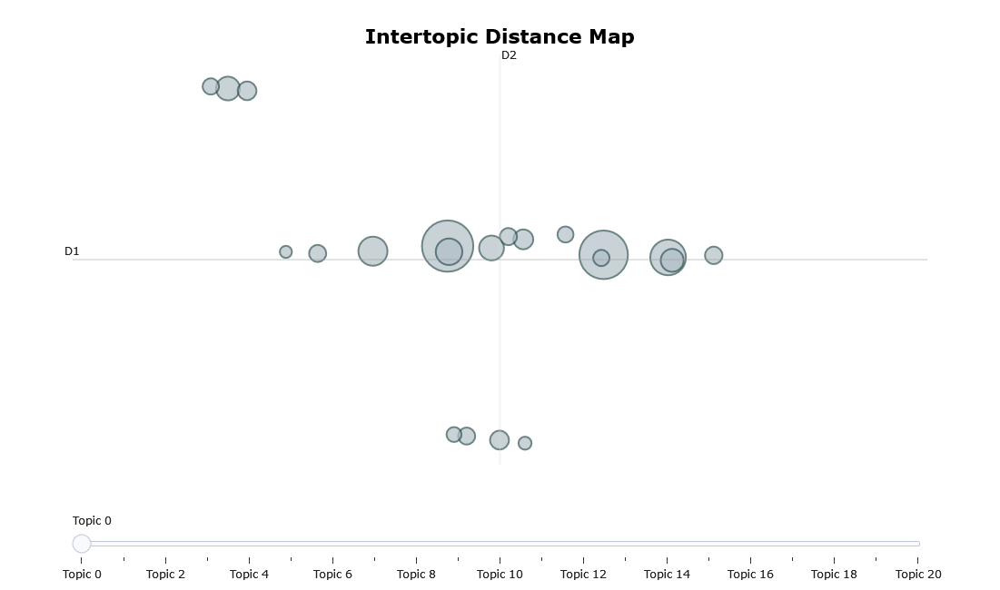

In [23]:
topic_model.visualize_topics(custom_labels=True)

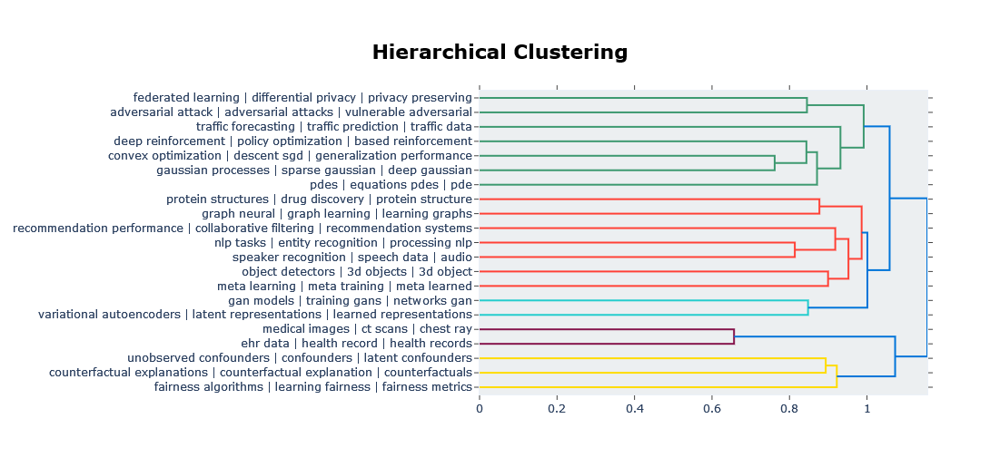

In [24]:
topic_model.visualize_hierarchy(custom_labels=True)

## **Visualize Documents**

When visualizing documents, it helps to have embedded the documents beforehand to speed up computation. Fortunately, we have already done that as a "best practice".

Visualizing documents in 2-dimensional space helps in understanding the underlying structure of the documents and topics.

In [25]:
# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)

The following plot is **interactive** which means that you can zoom in, double click on a label to only see that one and generally interact with the plot:

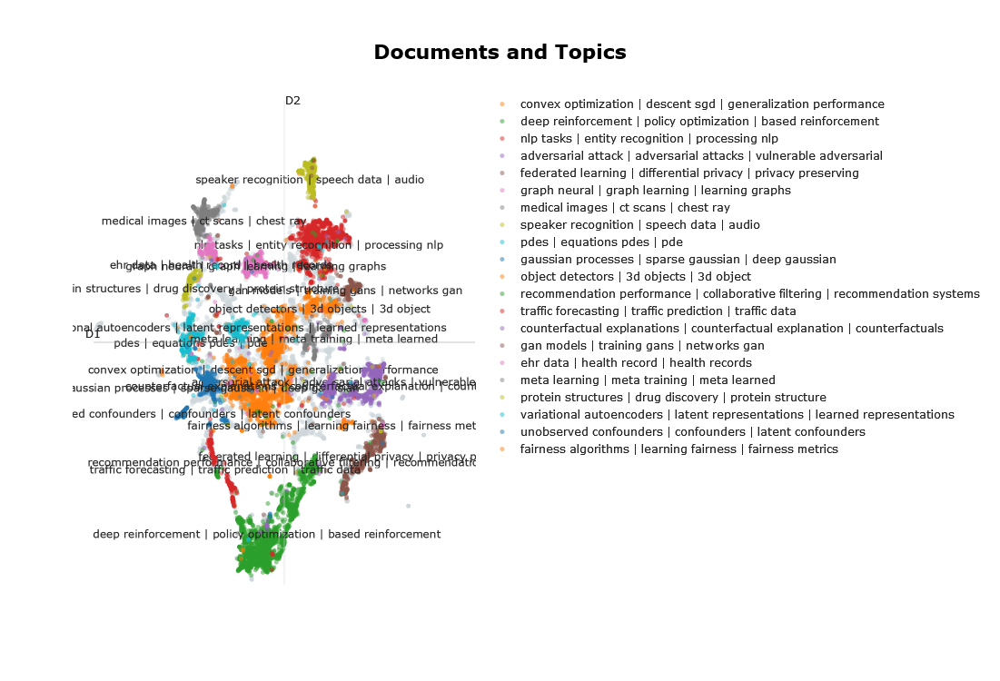

In [26]:
# Visualize the documents in 2-dimensional space and show the titles on hover instead of the abstracts
# NOTE: You can hide the hover with `hide_document_hover=True` which is especially helpful if you have a large dataset
topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, custom_labels=True)

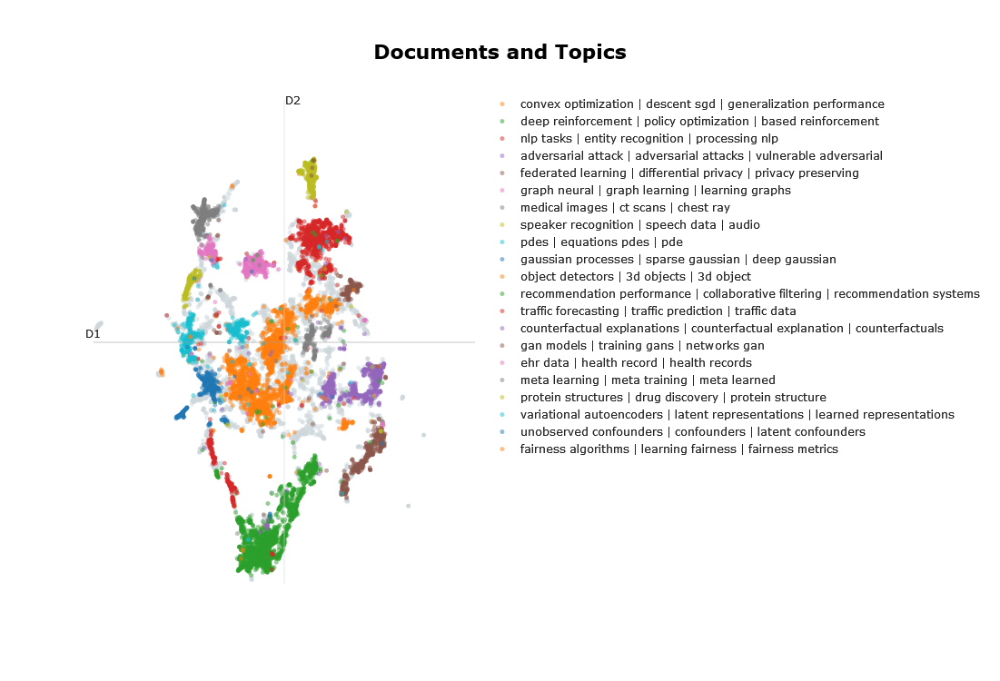

In [27]:
# We can also hide the annotation to have a more clear overview of the topics
topic_model.visualize_documents(titles, reduced_embeddings=reduced_embeddings, custom_labels=True, hide_annotations=True)

**💡  NOTE - 2-dimensional space 💡**
***
Although visualizing the documents in 2-dimensional gives an idea of their underlying structure, there is a risk involved.

Visualizing the documents in 2-dimensional space means that we have lost significant information since the original embeddings were more than 384 dimensions. Condensing all that information in 2 dimensions is simply not possible. In other words, it is merely an **approximation**, albeit quite an accurate one.
***

## **Serialization**

When saving a BERTopic model, there are several ways in doing so. You can either save the entire model with `pickle`, `pytorch`, or `safetensors`.

Personally, I would advise going with `safetensors` whenever possible. The reason for this is that the format allows for a very small topic model to be saved and shared.

When saving a model with `safetensors`, it skips over saving the dimensionality reduction and clustering models. The `.transform` function will still work without these models but instead assign topics based on the similarity between document embeddings and the topic embeddings.

As a result, the `.transform` step might give different results but it is generally worth it considering the smaller and significantly faster model.

In [28]:
embedding_model = "sentence-transformers/all-MiniLM-L6-v2"
topic_model.save("my_model_dir", serialization="safetensors", save_ctfidf=True, save_embedding_model=embedding_model)

**💡  NOTE - Embedding Model 💡**
***
Using `safetensors`, we are not saving the underlying embedding model but merely a pointer to the model. For example, in the above example we are saving the string `"sentence-transformers/all-MiniLM-L6-v2"` so that we can load in the embedding model alongside the topic model.

This currently only works if you are using a sentence transformer model. If you are using a different model, you can load it in when loading the topic model like this:

```python
from sentence_transformers import SentenceTransformer

# Define embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Load model and add embedding model
loaded_model = BERTopic.load("path/to/my/model_dir", embedding_model=embedding_model)
```
***

As mentioned above, loading can be done as follows:

In [29]:
from sentence_transformers import SentenceTransformer

# Define embedding model
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Load model and add embedding model
loaded_model = BERTopic.load("my_model_dir", embedding_model=embedding_model)

## **Inference**

To speed up the inference, we can leverage a "best practice" that we used before, namely serialization. When you save a model as `safetensors` and then load it in, we are removing the dimensionality reduction and clustering steps from the pipeline.

Instead, the assignment of topics is done through cosine similarity of document embeddings and topic embeddings. This speeds up inferences significantly.

To show its effect, let's start by disabling the logger:

In [30]:
from bertopic._utils import MyLogger
logger = MyLogger("ERROR")
loaded_model.verbose = False
topic_model.verbose = False

Then, we run inference on both the loaded model and the non-loaded model:

17.1 s ± 6.05 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


12.2 s ± 2.07 s per loop (mean ± std. dev. of 7 runs, 1 loop each)


Based on the above, the `loaded_model` seems to be quite a bit faster for inference than the original `topic_model`.